In [1]:
import pandas as pd
import geopandas as gpd
import os
import numpy as np
from shapely import Polygon
from geo import build_geojson_point, get_clipped_voronoi_shapes

### Chargement des adresses du REU

In [11]:
df = pd.read_csv(
#     'https://static.data.gouv.fr/resources/bureaux-de-vote-et-adresses-de-leurs-electeurs/20230626-140445/table-adresses-reu.csv', # pour aller chercher le fichier directement sur data.gouv
    'table-adresses-reu.csv', # si le fichier est en dur dans le même répertoire
    dtype={
        'code_commune_ref': str,
         'reconstitution_code_commune': int,
         'id_brut_bv_reu': str,
         'id': str,
         'geo_adresse': str,
         'geo_type': str,
         'geo_score': float,
         'longitude': float,
         'latitude': float,
         'api_line': str,
         'nb_bv_commune': int,
         'nb_adresses': int
    },
    nrows=1000
)
df

,code_commune_ref,reconstitution_code_commune,id_brut_bv_reu,id,geo_adresse,geo_type,geo_score,longitude,latitude,api_line,nb_bv_commune,nb_adresses
0,01001,2,01001_1,01001_0045,Rue des Bles d'Or 01400 L'Abergement-Clémenciat,street,0.85,4.926090,46.151757,BANN,1,5
1,01001,1,01001_1,01001_0040_00101,101 Impasse Bellevue 01400 L'Abergement-Clémen...,housenumber,0.91,4.924261,46.134889,BANG,1,1
2,01001,1,01001_1,01001_0175_00106,106 Route des Garaudes 01400 L'Abergement-Clém...,housenumber,0.91,4.923428,46.133930,BANG,1,1
3,01001,1,01001_1,01001_0230_00190,190 Impasse des Lilas 01400 L'Abergement-Cléme...,housenumber,0.91,4.923083,46.146773,BANG,1,2
4,01001,2,01001_1,01001_0175_00192,192 Route des Garaudes 01400 L'Abergement-Clém...,housenumber,0.95,4.923743,46.133608,BANG,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...
995,01004,1,01004_2,01004_0312_00002,2 Rue Gaston Brucher 01500 Ambérieu-en-Bugey,housenumber,0.96,5.356029,45.954645,BANG,8,1
996,01004,1,01004_2,01004_0281_00002_bis,2bis Allée Emmanuel Perret 01500 Ambérieu-en-B...,housenumber,0.96,5.357553,45.956818,BANG,8,1
997,01004,1,01004_2,01004_0260_00002_ter,2ter Rue du Dépôt 01500 Ambérieu-en-Bugey,housenumber,0.97,5.355416,45.957422,BANG,8,3
998,01004,1,01004_2,01004_0161_00020,20 Rue de la Bâtisse 01500 Ambérieu-en-Bugey,housenumber,0.96,5.360469,45.955032,BANG,8,2


### Création de la liste des départements

In [12]:
DEP_LIST = [
    "0"+str(i) for i in range(1, 10)
]+[
    str(i) for i in range(10, 20)
]+["2A", "2B"]+[
    str(i) for i in range(21, 96)
] + [
    str(i) for i in range(971, 977)
]

### Chargement des géométries des communes

In [2]:
commune_shapes_path = "http://etalab-datasets.geo.data.gouv.fr/contours-administratifs/2022/geojson/communes-5m.geojson"
communes_france = gpd.read_file(commune_shapes_path)
communes_france = communes_france.rename(
    {'code': 'insee'}, axis=1
)[['insee', 'geometry']]
communes_france

,insee,geometry
0,01001,"POLYGON ((4.95841 46.15327, 4.95812 46.15316, ..."
1,01002,"POLYGON ((5.43020 45.98277, 5.43001 45.98299, ..."
2,01004,"POLYGON ((5.40882 45.94206, 5.40850 45.94210, ..."
3,01005,"POLYGON ((4.94298 45.97962, 4.94257 45.97949, ..."
4,01006,"POLYGON ((5.57083 45.75338, 5.57219 45.75357, ..."
...,...,...
35089,98830,"MULTIPOLYGON (((165.25608 -20.86528, 165.25637..."
35090,98831,"MULTIPOLYGON (((164.69511 -21.04249, 164.69504..."
35091,98832,"MULTIPOLYGON (((167.03572 -22.29068, 167.03563..."
35092,98833,"MULTIPOLYGON (((165.88247 -21.39642, 165.88252..."


### Créations de contours des bureaux de vote par département

In [ ]:
if not 'geojson' in os.listdir():
    os.mkdir('geojson')
for DEP in DEP_LIST:
    print(DEP)
    addresses_df = df.loc[df['code_commune_ref'].str.startswith(DEP)]
    
    communes_dep = communes_france[communes_france.insee.str.startswith(str(DEP))]
    codes2drop = ('13055', '75056', '69123')
    communes_dep = communes_dep.loc[~(communes_dep['insee'].str.startswith(codes2drop))]
    
    # The lines below creates an (unofficial) identifier of bureau de vote
    # We use it in this code mostly for displaying purposes
    addresses_df['id_bv'] = addresses_df['id_brut_bv']
    addresses_df['commune_bv'] = addresses_df['code_commune_ref']

    geo_addresses = build_geojson_point(addresses_df)
    hulls = get_clipped_voronoi_shapes(geo_addresses, communes_dep)
    id_bvs = []
    coordinates = []
    # formatting the cordinates into a list of [x, y]
    for _, row in hulls.iterrows():
        id_bvs.append(row["id_bv"])
        try:
            coord = Polygon(
                [
                    list(x)
                    for x in np.transpose(
                        [
                            list(row["geometry"].exterior.coords.xy[0]),
                            list(row["geometry"].exterior.coords.xy[1]),
                        ]
                    )
                ]
            )
            coordinates.append(coord)
        except Exception as e:
            coordinates.append([])
            pass

    voronoi_polygons = gpd.GeoDataFrame(
        pd.DataFrame(data={"coordinates": coordinates, "id_bv": id_bvs}),
        geometry='coordinates'
    )
    # handling overlaps
    for main_idx in voronoi_polygons.index:
        for side_idx in voronoi_polygons.index:
            if main_idx != side_idx:
                if voronoi_polygons.loc[main_idx, 'coordinates'].contains(voronoi_polygons.loc[side_idx, 'coordinates']):
                    voronoi_polygons.loc[main_idx, 'coordinates'] = voronoi_polygons.loc[main_idx, 'coordinates'].difference(voronoi_polygons.loc[side_idx, 'coordinates'])
    # grouping polygons into multipolygons for each BdV
    voronoi_polygons = voronoi_polygons.dissolve('id_bv').reset_index(names='id_bv').reset_index(names='id')
    # int ID as requested for downstream processes
    voronoi_polygons['id'] = voronoi_polygons['id'].astype(int)
    with open(f"geojson/voronoi_contours_{DEP}.geojson", 'w') as f:
        f.write(voronoi_polygons.to_json())

### Visualisation du découpage pour chaque département

C:\Users\Dinum\Documents\Projets\Elections\venv_elections\lib\site-packages\geopandas\plotting.py:673: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


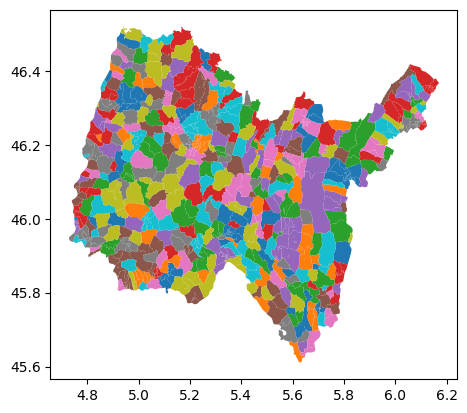

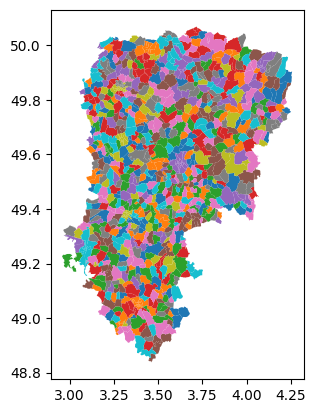

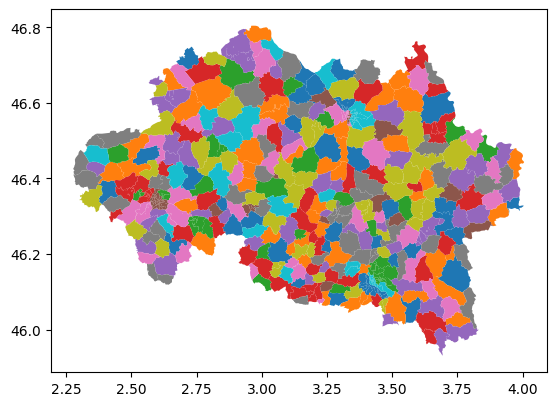

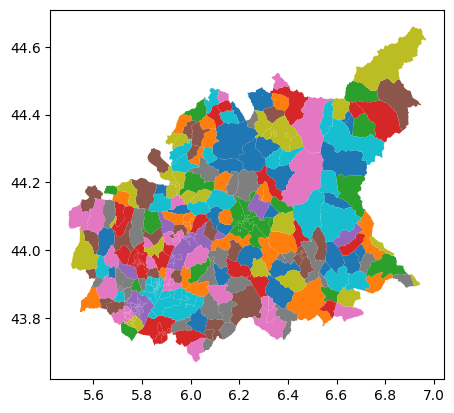

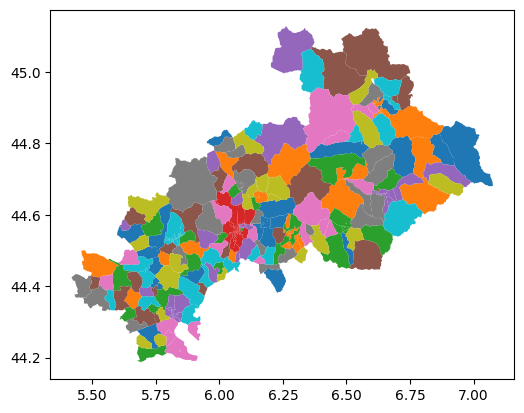

...

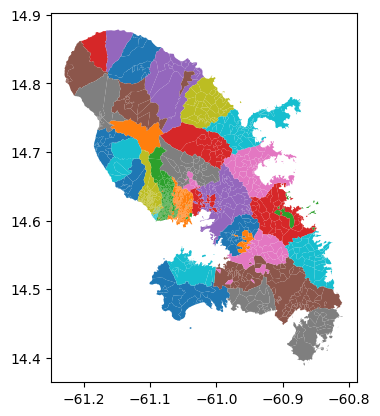

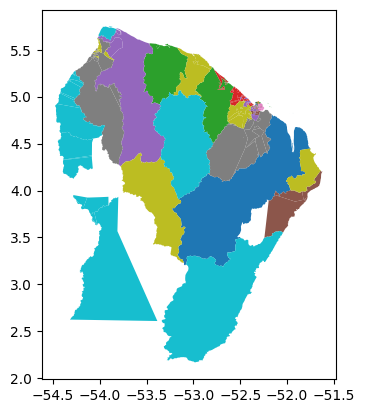

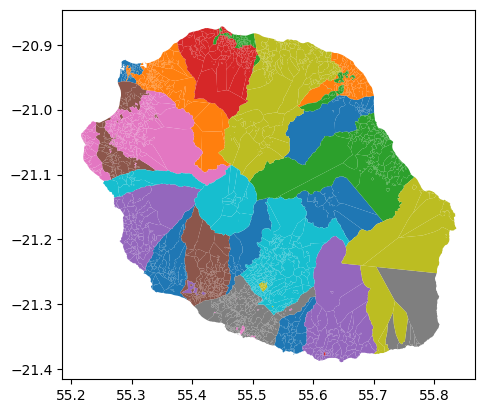

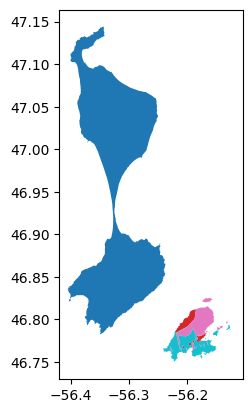

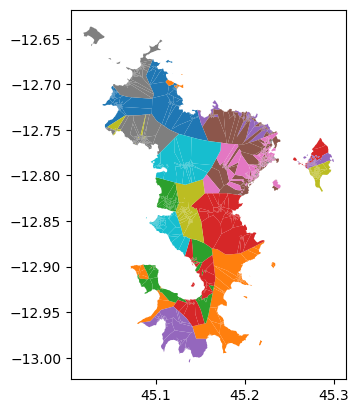

In [20]:
for DEP in DEP_LIST:
    try:
        contours = gpd.read_file(f'geojson/voronoi_contours_{DEP}.geojson')
        contours.plot('id_bv')
    except Exception as e:
        print(d)
        print(e)

### Création du fichier geojson à l'échelle de la France

In [21]:
contours_france = []
for DEP in DEP_LIST:
    try:
        contours = gpd.read_file(f"geojson/voronoi_contours_{DEP}.geojson")
        contours_france.append(contours)
    except Exception as e:
        print(d)
        print(e)
contours_france = pd.concat(contours_france)
geo_contours_france = gpd.GeoDataFrame(contours_france)
geo_contours_france = geo_contours_france.drop('id', axis=1)
geo_contours_france

,id_bv,geometry
0,01001_1,"POLYGON ((4.95812 46.15316, 4.95771 46.15288, ..."
1,01002_1,"POLYGON ((5.43001 45.98299, 5.42980 45.98312, ..."
2,01004_1,"POLYGON ((5.33312 45.95904, 5.33358 45.95987, ..."
3,01004_2,"MULTIPOLYGON (((5.35287 45.95468, 5.35225 45.9..."
4,01004_3,"POLYGON ((5.36083 45.94544, 5.36069 45.94557, ..."
...,...,...
176,97617_23,"MULTIPOLYGON (((45.13320 -12.79175, 45.13341 -..."
177,97617_49,"MULTIPOLYGON (((45.13359 -12.79192, 45.13344 -..."
178,97617_73,"MULTIPOLYGON (((45.09781 -12.79254, 45.09773 -..."
179,97617_74,"MULTIPOLYGON (((45.13136 -12.79085, 45.13146 -..."


### Visualisation du découpage en métropole (pour plus de lisibilité)

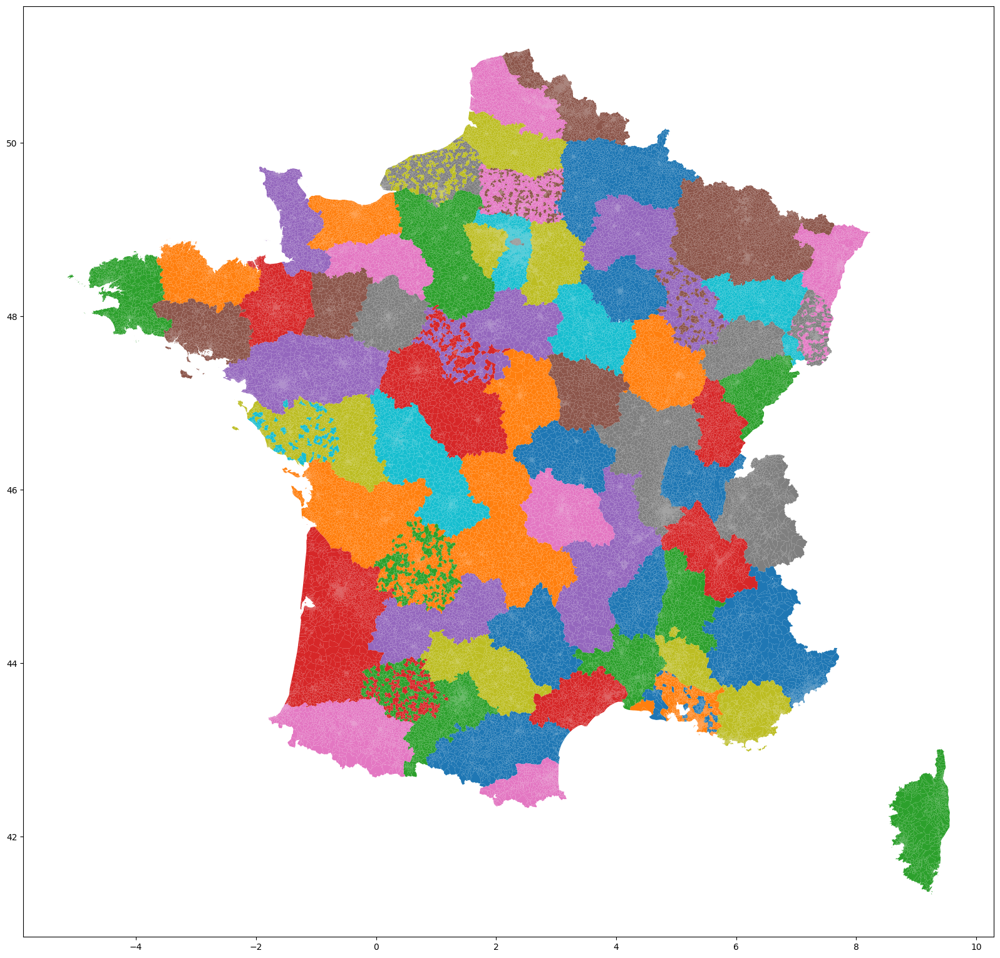

In [22]:
geo_contours_france[
    ~(geo_contours_france['id_bv'].str.startswith('97'))
].plot('id_bv', figsize=(20,30));

### Export en geojson

In [ ]:
geo_contours_france.to_file(
    "geojson/contours_france_entiere.geojson",
    driver="GeoJSON"
)